In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
 
# from scipy import stats
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split ,cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
 
from sklearn.metrics import classification_report
from sklearn.cluster import k_means
from sklearn.cluster import KMeans

In [3]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', None)
 
 
df = pd.read_csv('bank-additional-full.csv', sep=';')

In [4]:
df.info()
df.shape
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


C:\Users\PC\AppData\Local\Temp\ipykernel_9756\2958473278.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  countplt=sns.countplot(x='y', data=df, palette ='Set1')


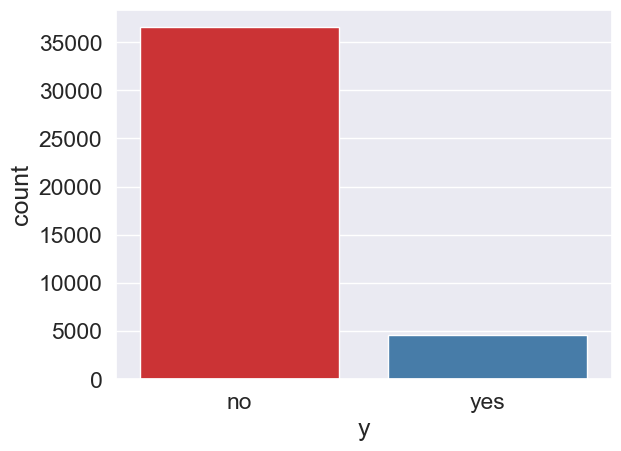

In [5]:
#checking for any  missing values
df.isnull().sum()


#how many clients have subscribed 
df.y.value_counts() 


#with graphs
sns.set(font_scale=1.5)
countplt=sns.countplot(x='y', data=df, palette ='Set1')
plt.show()

In [6]:
df.y.value_counts() 

y
no     36548
yes     4640
Name: count, dtype: int64

In [7]:
df.duplicated().sum()

np.int64(12)

In [8]:
df = df.drop_duplicates()

In [9]:
df.y.value_counts()

y
no     36537
yes     4639
Name: count, dtype: int64

In [10]:
#Dealing with the variable that label as unknown (missing data)
df[df['marital'] == "unknown"]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
40,58,management,unknown,university.degree,no,yes,no,telephone,may,mon,366,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
390,59,retired,unknown,university.degree,unknown,no,no,telephone,may,tue,253,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
413,57,retired,unknown,basic.4y,no,no,no,telephone,may,tue,673,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1493,33,services,unknown,high.school,no,yes,yes,telephone,may,thu,155,2,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1608,32,unknown,unknown,university.degree,no,no,no,telephone,may,fri,617,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,yes
3167,57,retired,unknown,basic.4y,no,yes,no,telephone,may,thu,171,10,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no
3478,37,management,unknown,high.school,no,no,no,telephone,may,thu,95,6,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no
4196,31,admin.,unknown,high.school,no,no,no,telephone,may,mon,182,8,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no
4344,32,unknown,unknown,university.degree,no,yes,yes,telephone,may,tue,40,1,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
4454,31,blue-collar,unknown,unknown,unknown,no,no,telephone,may,tue,170,2,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no


In [11]:
# dropping the martial status which is unknown from our dataframe
df.drop(df[df['marital'] == "unknown"].index, inplace=True)

In [12]:
df.education.value_counts() 

education
university.degree      12133
high.school             9498
basic.9y                6037
professional.course     5234
basic.4y                4170
basic.6y                2285
unknown                 1721
illiterate                18
Name: count, dtype: int64

In [13]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000
mean,40.023311,258.209899,2.566673,962.514186,0.172815,0.082512,93.575923,-40.502246,3.621894,5167.053638
std,10.420089,259.245306,2.767906,186.816397,0.494837,1.570683,0.578727,4.627021,1.734266,72.255185
min,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.000000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.000000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


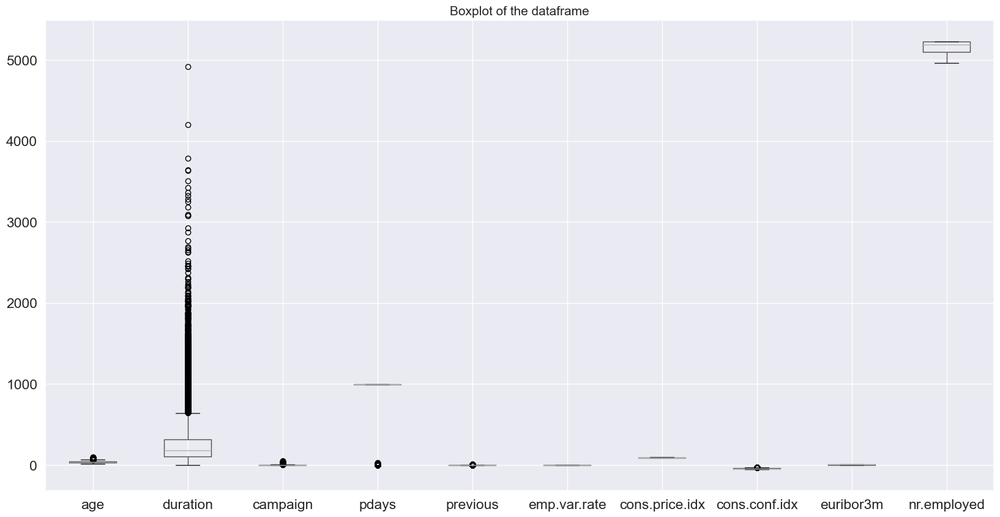

In [14]:
# checking for outliers in dataset
plt.figure(figsize=(20,10))
df.boxplot()
plt.title("Boxplot of the dataframe", fontsize = 15)
print()

outliers in duration because its measured in seconds not minutes


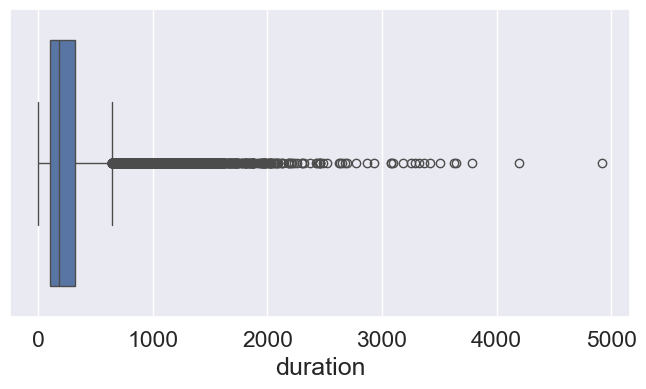

In [15]:
# looking inside duration variable boxplot
plt.figure(figsize=(8, 4))
sns.boxplot(x=df['duration'])
plt.show()

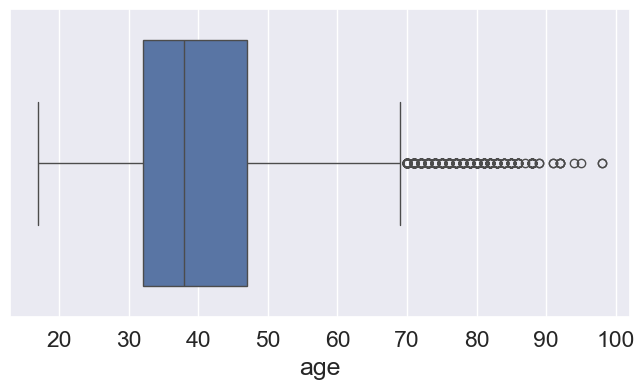

In [16]:
# looking inside age variable boxplot
plt.figure(figsize=(8, 4))
sns.boxplot(x=df['age'])
plt.show() 

<Axes: xlabel='y', ylabel='age'>

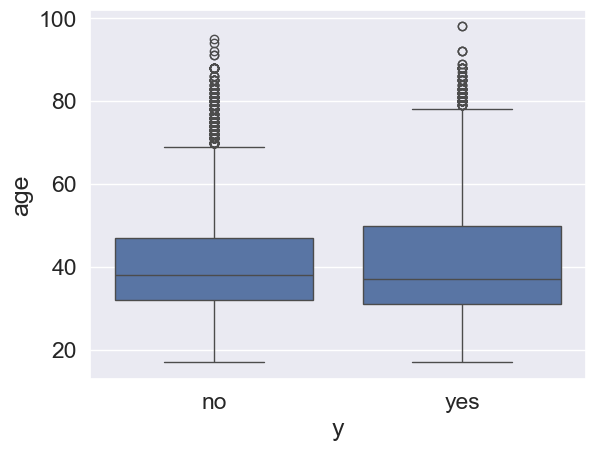

In [17]:
sns.boxplot(x = 'y', y = 'age', data = df)

we cant see much difference  in  age  for  people  who churned and people  who didnt


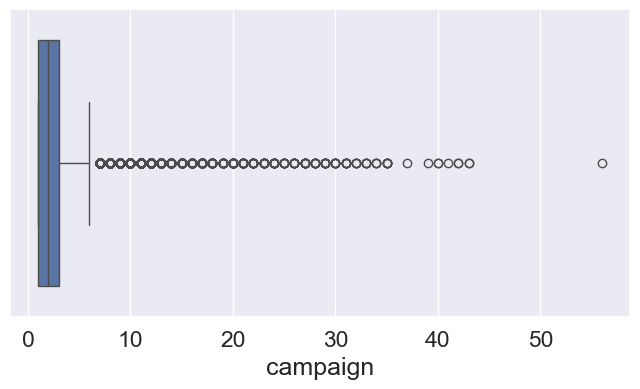

In [18]:
# looking inside campaign variable boxplot
plt.figure(figsize=(8, 4))
sns.boxplot(x=df['campaign'])
plt.show()

<Axes: xlabel='y', ylabel='campaign'>

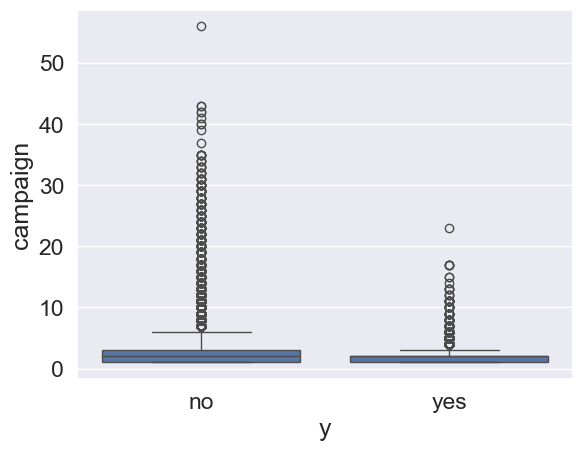

In [19]:
sns.boxplot(x = 'y', y = 'campaign', data = df)

In [20]:
Q1_d = df['duration'].quantile(.25)
Q3_d = df['duration'].quantile(.75)
Q1_a = df['age'].quantile(.25)
Q3_a = df['age'].quantile(.75)
Q1_c = df['campaign'].quantile(.25)
Q3_c = df['campaign'].quantile(.75)

In [21]:
IQR_d = Q3_d - Q1_d
IQR_a = Q3_a - Q1_a
IQR_c = Q3_c - Q1_c

In [22]:
print(IQR_d)
print(IQR_a)
print(IQR_c)

217.0
15.0
2.0


In [23]:
lower_d = Q1_d - 1.5 * IQR_d
upper_d = Q3_d + 1.5 * IQR_d
lower_a = Q1_a - 1.5 * IQR_a
upper_a = Q3_a + 1.5 * IQR_a
lower_c = Q1_c - 1.5 * IQR_d
upper_c = Q3_c + 1.5 * IQR_d

In [24]:
print(lower_d,upper_d)
print(lower_a,upper_a)
print(lower_c,upper_c)

-223.5 644.5
9.5 69.5
-324.5 328.5


Duration <- Above 644.5 second is outliers for duration

Age <- Above 69.5 years is outliers

campaign <- above 328.5 is outliers

In [25]:
# new dataframe created after removing outlier that exist outside the interval assign
df_out = df[df['duration'] >= lower_d] 
df_out= df[df['duration'] <= upper_d] 


# new dataframe created after removing outlier that exist outside the interval assign
df_out = df[df['age'] >= lower_a] 
df_out= df[df['age'] <= upper_a] 


# new dataframe created after removing outlier that exist outside the interval assign
df_out = df[df['campaign'] >= lower_c] 
df_out= df[df['campaign'] <= upper_c]

In [26]:
df_out.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000
mean,40.023311,258.209899,2.566673,962.514186,0.172815,0.082512,93.575923,-40.502246,3.621894,5167.053638
std,10.420089,259.245306,2.767906,186.816397,0.494837,1.570683,0.578727,4.627021,1.734266,72.255185
min,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.000000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.000000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [27]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000,41096.000000
mean,40.023311,258.209899,2.566673,962.514186,0.172815,0.082512,93.575923,-40.502246,3.621894,5167.053638
std,10.420089,259.245306,2.767906,186.816397,0.494837,1.570683,0.578727,4.627021,1.734266,72.255185
min,17.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.000000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.000000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.000000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


CORRELATION //////////////////////////////////////////


In [28]:
num_df = df.select_dtypes(include=[float, int])
corr_matrix = num_df.corr()
print(corr_matrix)

                     age  duration  campaign     pdays  previous  \
age             1.000000 -0.001414  0.004117 -0.035040  0.024821   
duration       -0.001414  1.000000 -0.071767 -0.047526  0.020336   
campaign        0.004117 -0.071767  1.000000  0.052477 -0.079105   
pdays          -0.035040 -0.047526  0.052477  1.000000 -0.587662   
previous        0.024821  0.020336 -0.079105 -0.587662  1.000000   
emp.var.rate   -0.000642 -0.027923  0.150454  0.271068 -0.420431   
cons.price.idx  0.000665  0.005598  0.127120  0.078883 -0.202701   
cons.conf.idx   0.129279 -0.008223 -0.013610 -0.091437 -0.051025   
euribor3m       0.010417 -0.032824  0.134818  0.296796 -0.454390   
nr.employed    -0.018144 -0.044734  0.143812  0.372446 -0.501320   

                emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  \
age                -0.000642        0.000665       0.129279   0.010417   
duration           -0.027923        0.005598      -0.008223  -0.032824   
campaign            0.150454 

In [29]:
#creating correlation heatmap


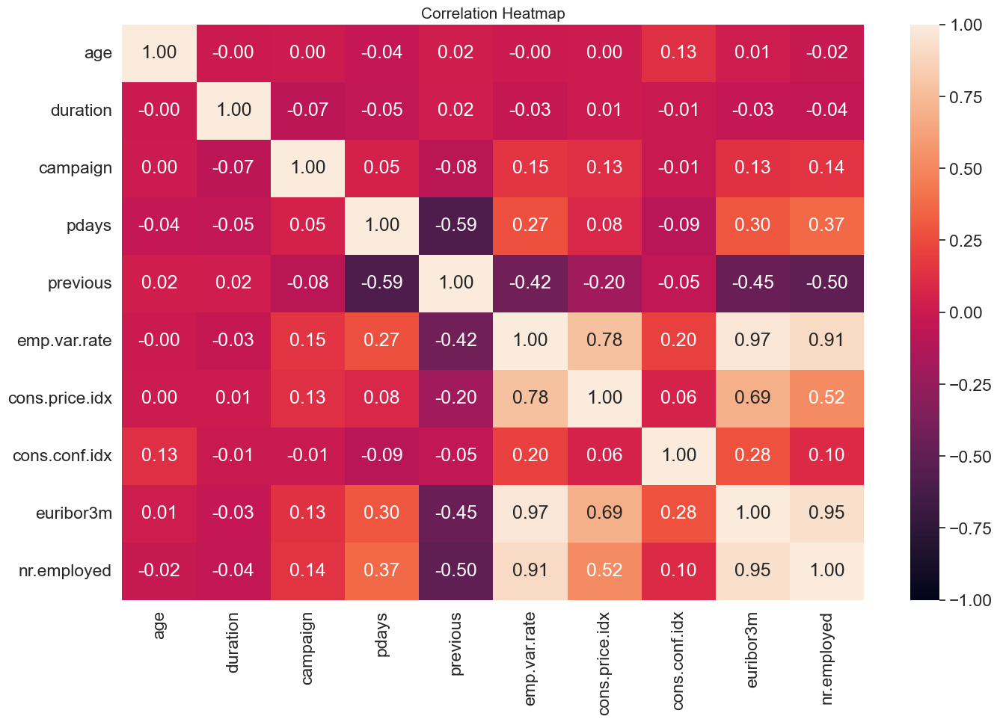

In [30]:
# Creating correlation heat map.
plt.figure(figsize=(16,10))
sns.heatmap(corr_matrix, annot=True, vmin=-1, vmax=1,fmt='.2f')
plt.title("Correlation Heatmap", fontsize = 15)
plt.show()

From the above heatmap, we can see that few variables in the dataset are highly correlated.

We see from above that any lightier shade color box except the diagnol shows high positive correlation. We see from above that any darker color box shows high negative correlation.

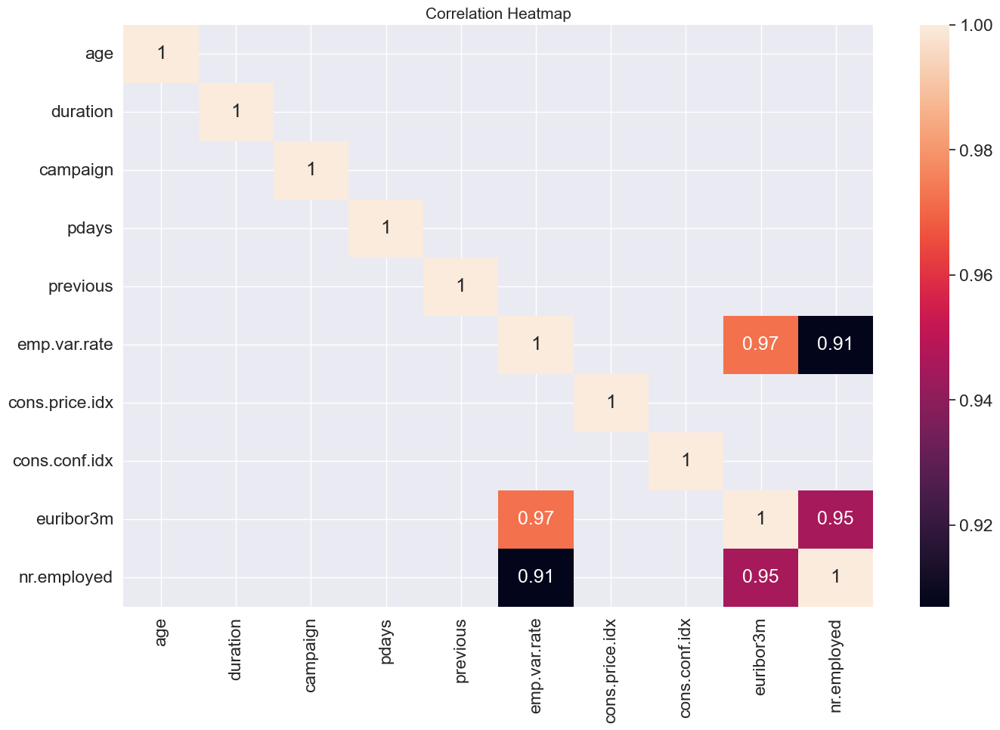

In [31]:
# plotting the heatmap of only highly correlated varibles with threshold value 0.9
plt.figure(figsize=(16,10))
sns.heatmap(corr_matrix[corr_matrix > 0.9], annot=True)
plt.title("Correlation Heatmap",  fontsize = 15)
plt.show()

There are 3 variables which are largely correlated to each other, we are assuming a threshold as 0.9, the value greater then this threshold is assumed to be highly correlated. For instance, euribor3m, nr.employed, emp.var.rate all have correlation values greater than threshold value(0.9).

In [32]:
# changing yes to 1 and no to 0
df['y'] = (df['y']=='yes').astype(int) 
df.y.value_counts() 

y
0    36469
1     4627
Name: count, dtype: int64

In [33]:
df.head


<bound method NDFrame.head of        age            job   marital            education  default  housing  \
0       56      housemaid   married             basic.4y       no       no   
1       57       services   married          high.school  unknown       no   
2       37       services   married          high.school       no      yes   
3       40         admin.   married             basic.6y       no       no   
4       56       services   married          high.school       no       no   
5       45       services   married             basic.9y  unknown       no   
6       59         admin.   married  professional.course       no       no   
7       41    blue-collar   married              unknown  unknown       no   
8       24     technician    single  professional.course       no      yes   
9       25       services    single          high.school       no      yes   
10      41    blue-collar   married              unknown  unknown       no   
11      25       services    singl

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\100583091.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['age'], color = 'green')


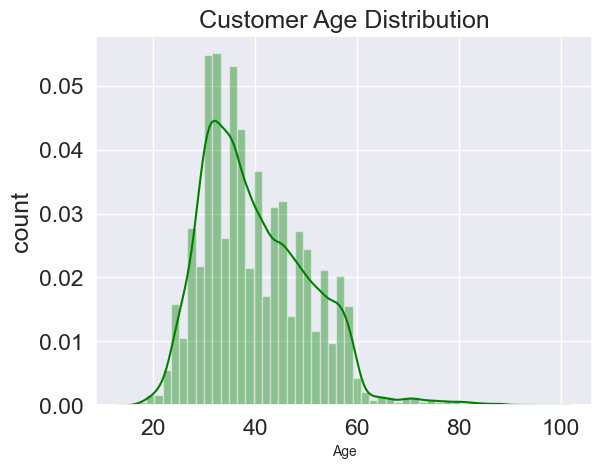

In [34]:
#Distribution plot for age column to see which age group have subscribe the term deposit
sns.distplot(df['age'], color = 'green')
plt.title('Customer Age Distribution', fontsize = 18)
plt.xlabel('Age', fontsize = 10)
plt.ylabel('count')
plt.show()

Between age 25 and 45 years old people have subscribed the term deposit.

Creating a countplot (bar plot showing counts using seaborn) that shows the counts of term deposit by job, martial status, education, default, so on for all categorical variables with the color hue defined by y

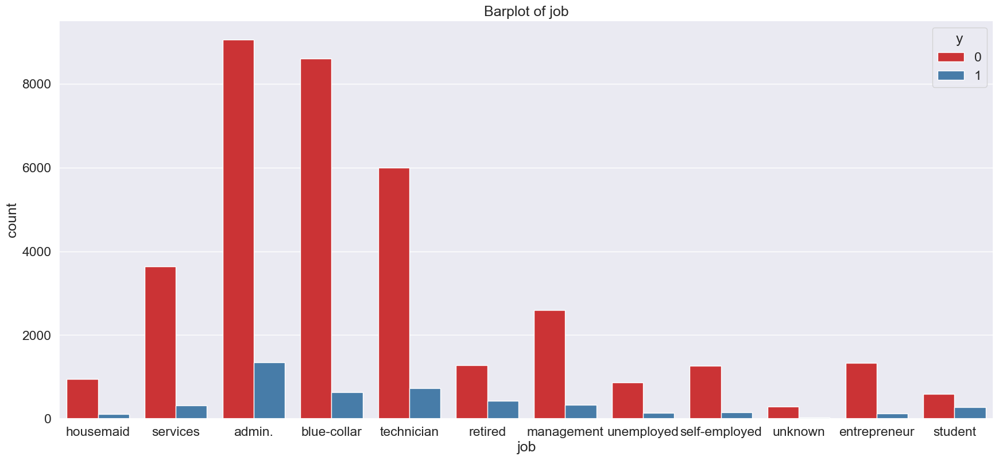

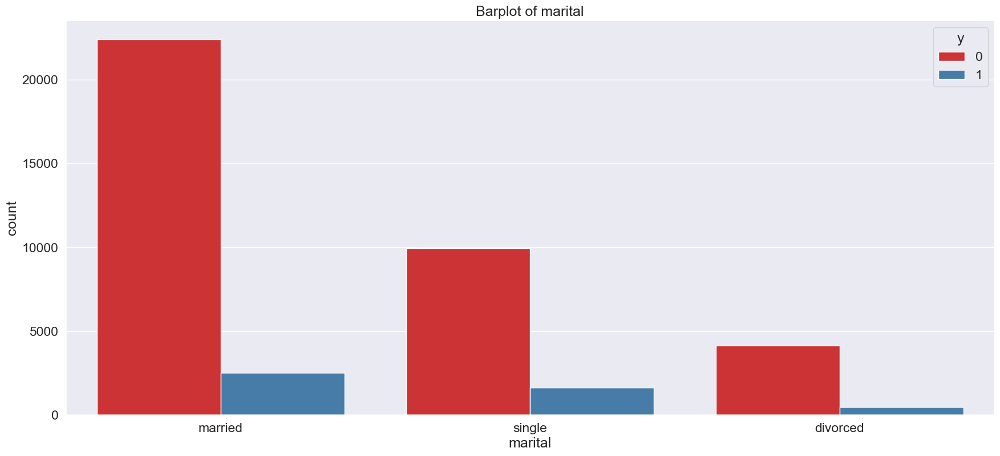

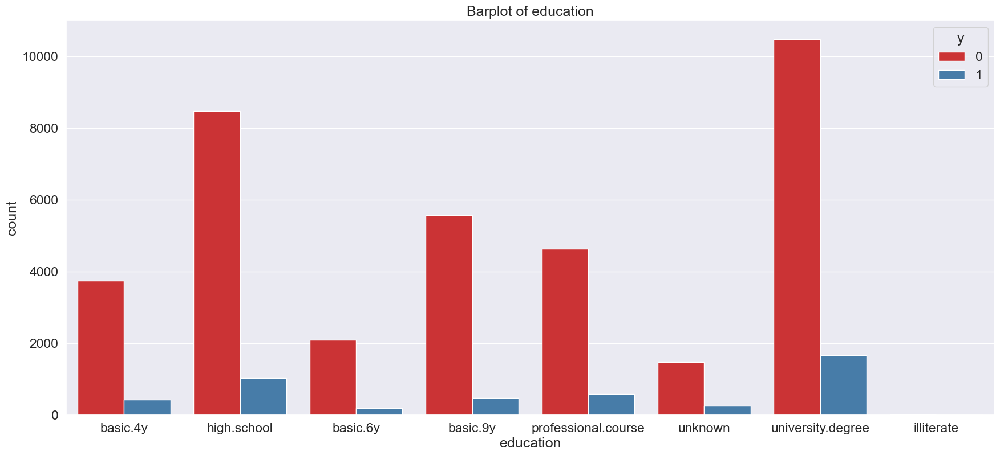

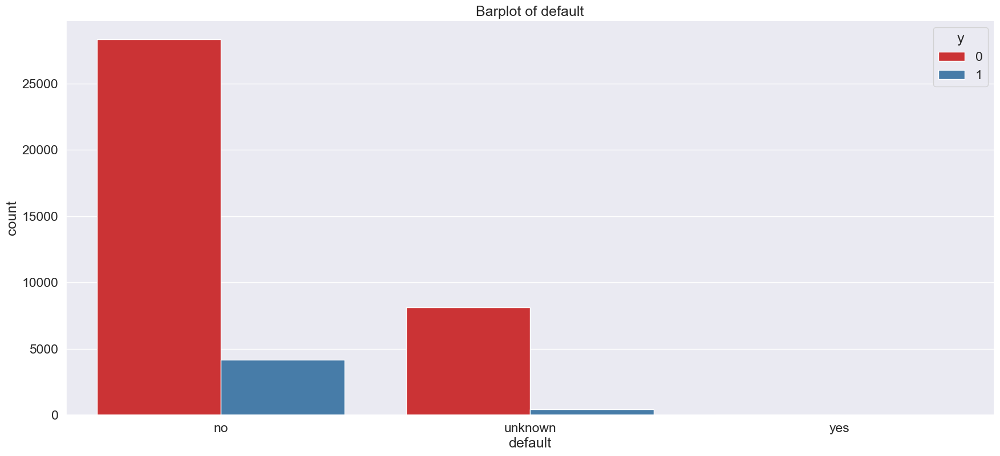

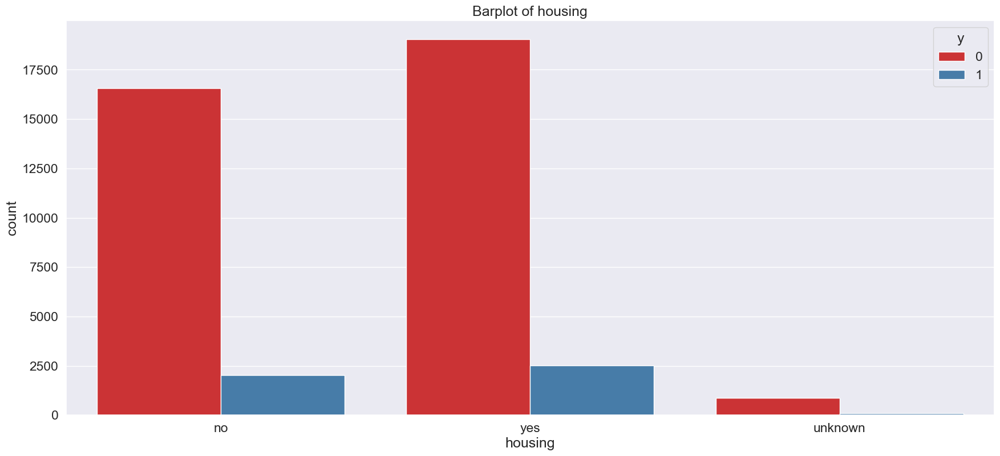

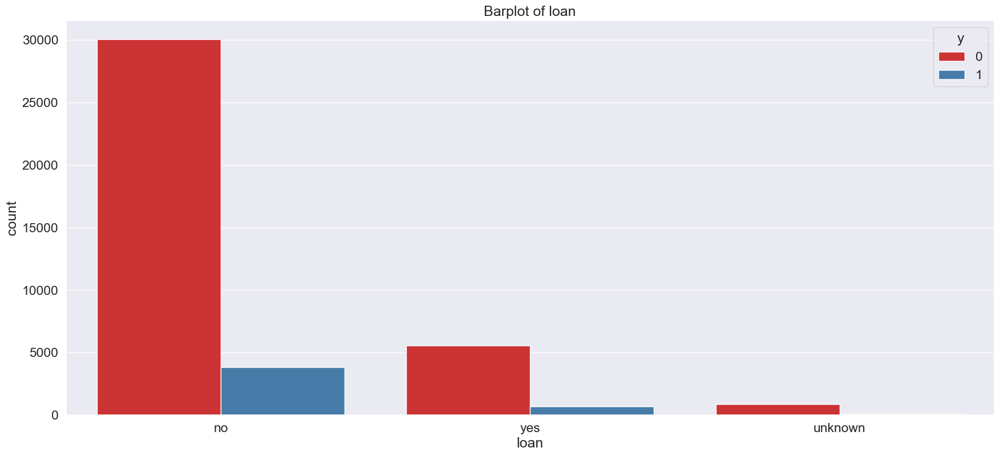

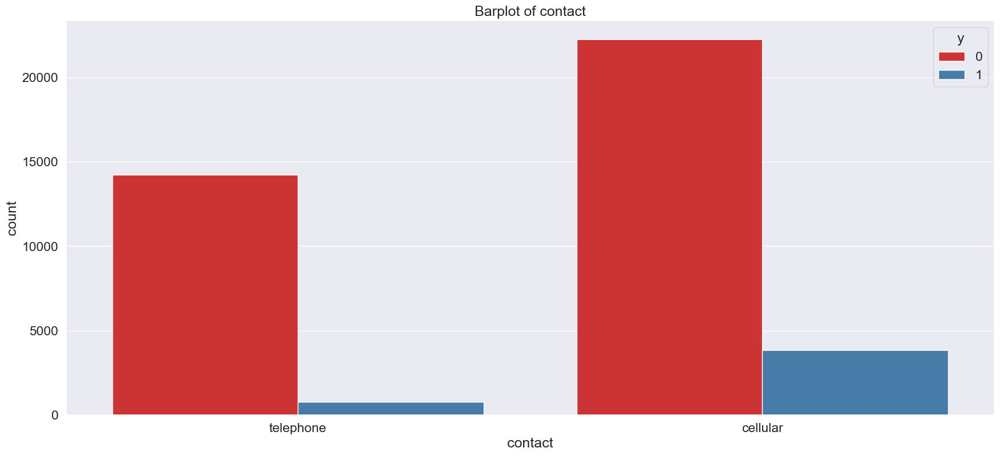

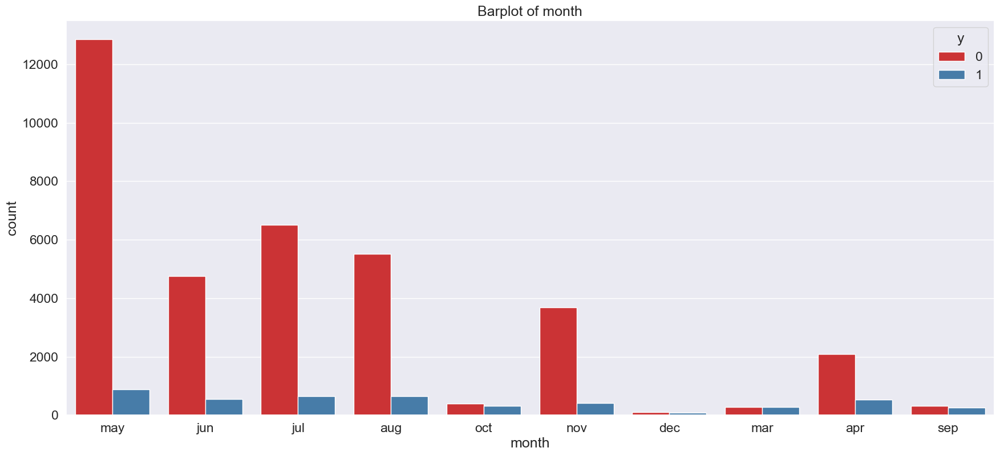

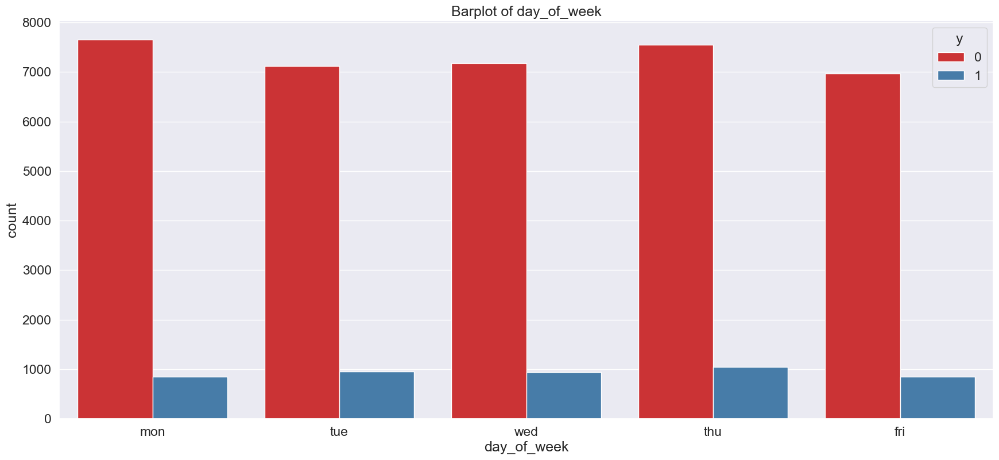

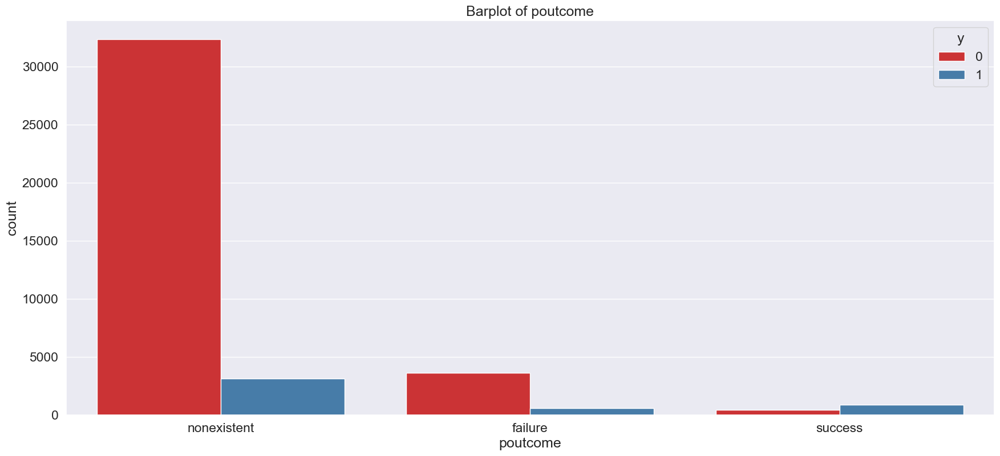

In [35]:
cat_list = ['job','marital','education','default','housing','loan','contact','month','day_of_week','poutcome']
for column in cat_list:
    plt.figure(figsize=(21,9))
    sns.countplot(x = column, data = df, hue = 'y', palette = 'Set1')
    plt.title('Barplot of '+column)
    plt.show()

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


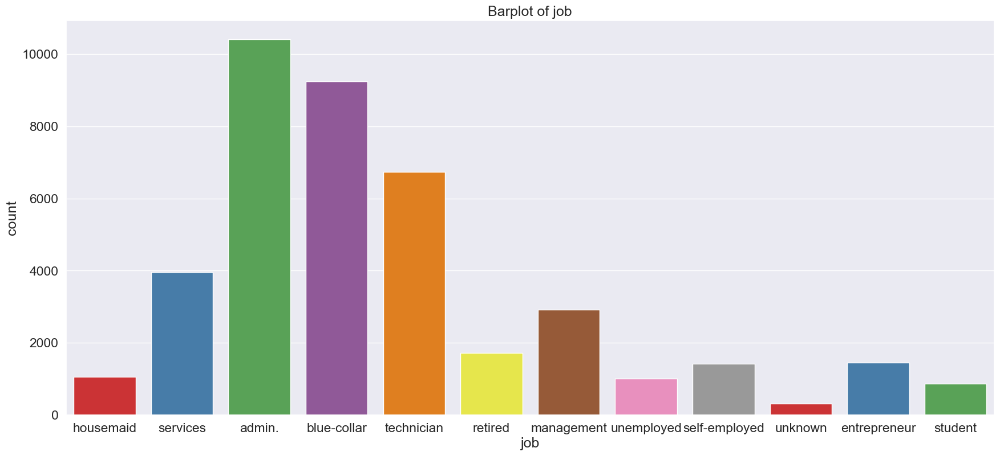

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


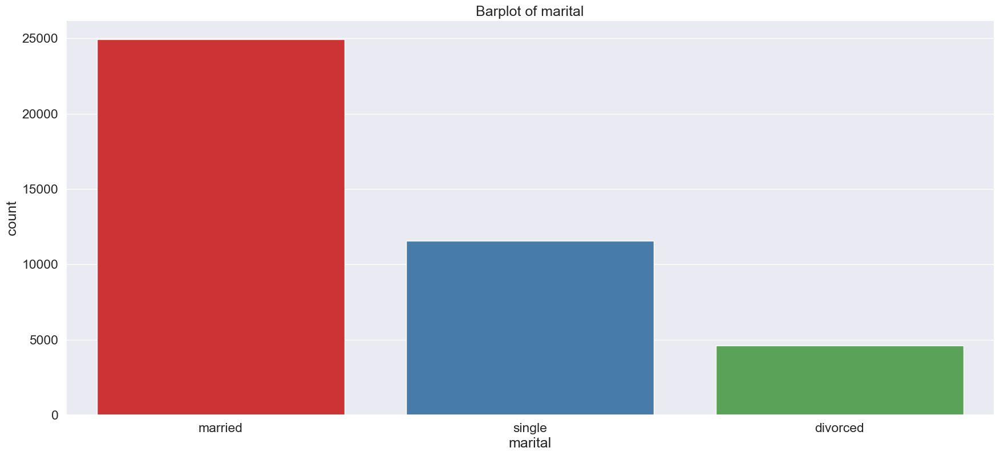

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


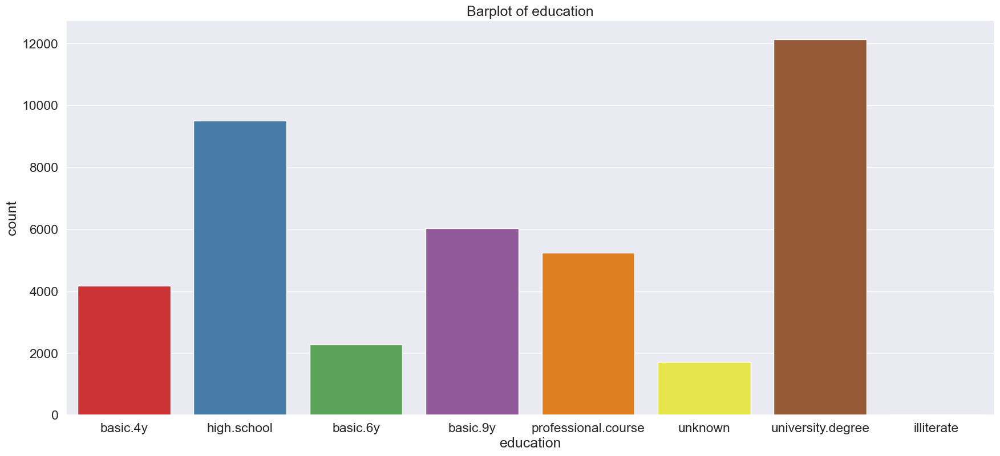

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


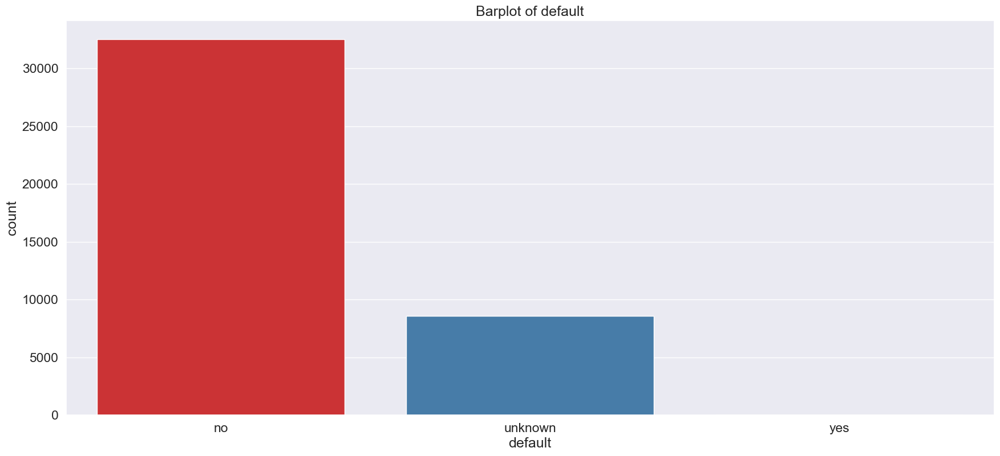

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


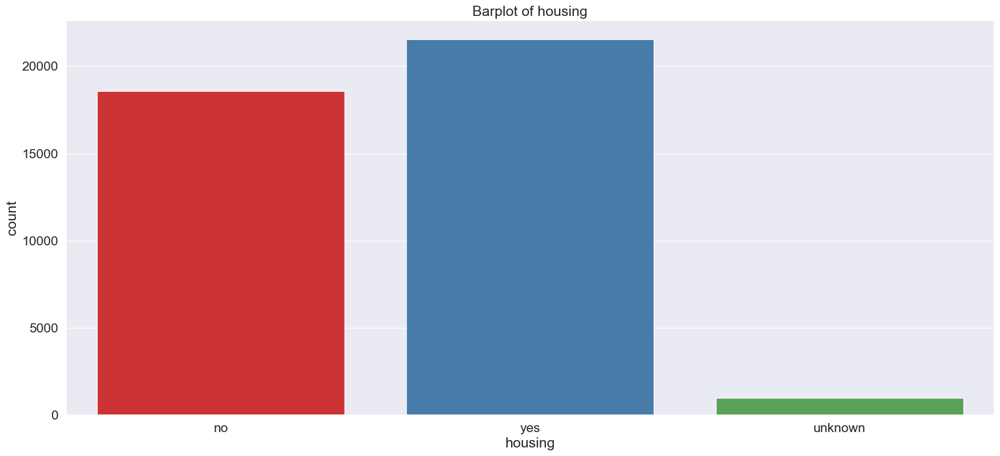

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


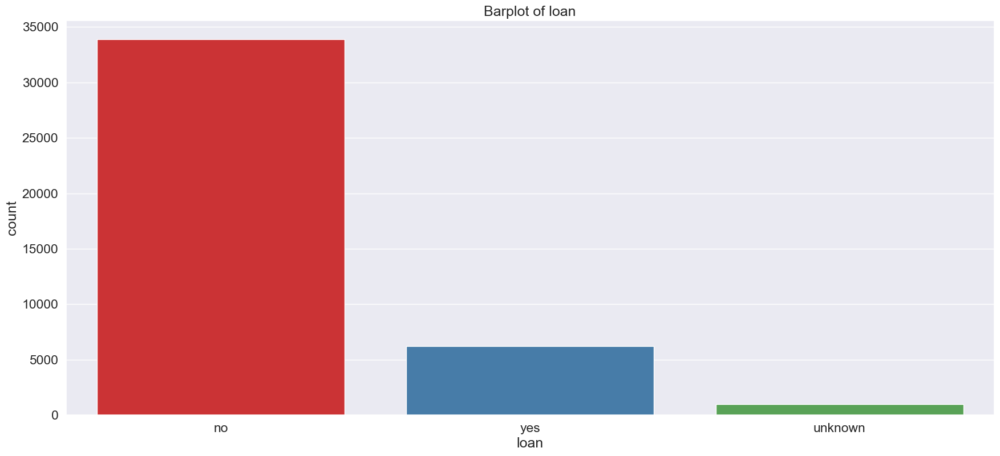

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


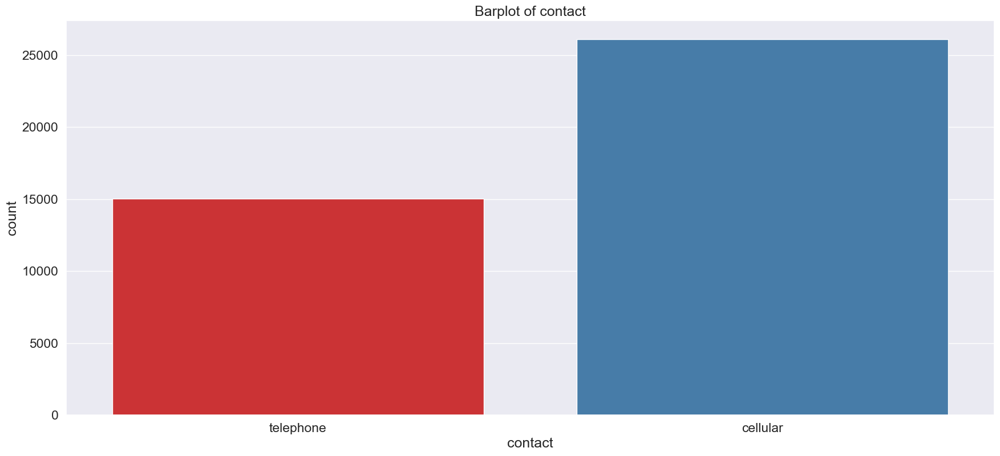

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


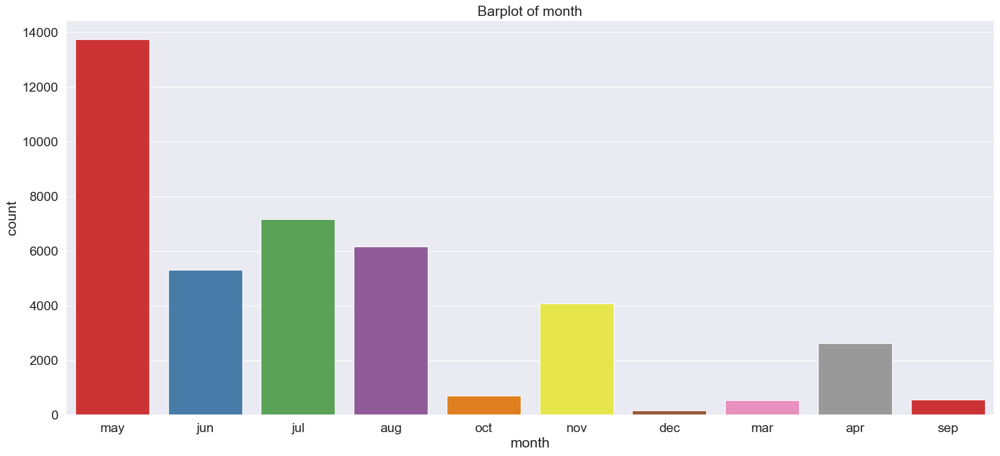

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


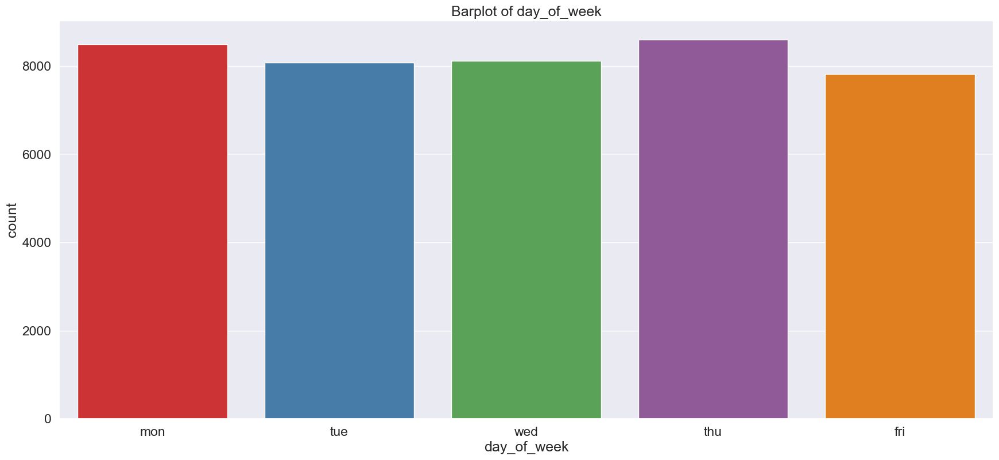

C:\Users\PC\AppData\Local\Temp\ipykernel_9756\1051385200.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = column, data = df, palette = 'Set1')


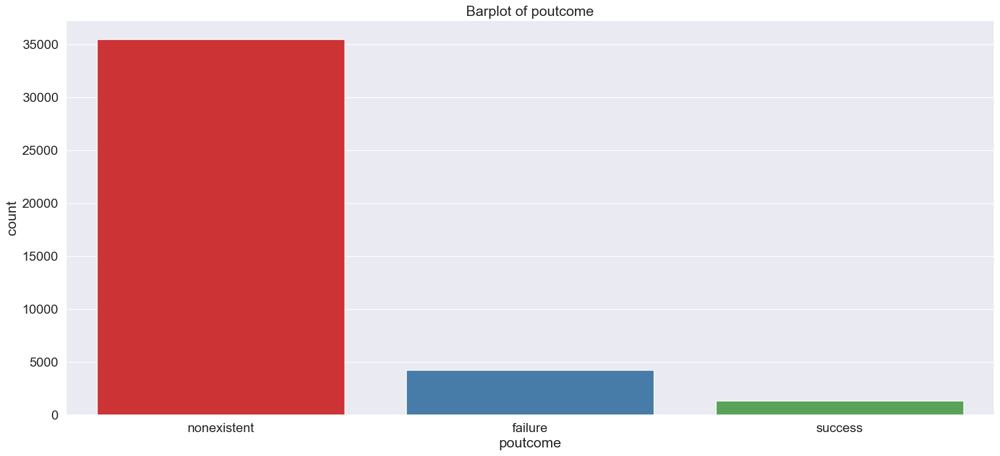

In [36]:
for column in cat_list:
    plt.figure(figsize=(21,9))
    sns.countplot(x = column, data = df, palette = 'Set1')
    plt.title('Barplot of '+column)
    plt.show()

By looking at the above countplot, we can see client whose job profession is admin has subscribed more to the term deposit, but they are also highest when it comes to not subcribing.

Majority of bank clients are married in status followed by single, divorced.

People who have university degree are showing more interest. Followed by technician, blue-collar jobs. We can say people who are earning good, are more responsive to term deposit.

May-August are the month where client were contacted more by bank. We can say summer is the time where customer are contacted more by bank.Also customer are accepting more term deposits during this time.

Cellular phone is used more to communicate with the clients.

The peoples with university degree education are the most subscribers to term deposit among all types of educated people.

Default denotes if the customer has credit in default or not.

Housing denotes if the customer has a housing loan. From the above graph we can see majority of clients have housing loan.

Looking at the plot of day_of_week with respect to term deposit, we observe all the days have the almost similar distribution for both the classes. We can conclude that this features will not be helpful in predicting the target variable.

From the above plot we can see the previous marketing campaign outcome does not exists. We can say most of the clients are new customer, those who have not been contacted earlier. Looking at the distribution of "1" and "0" we can say those who have contacted earlier are subcribing the term deposit as success rate is higher for term deposit '1'. We can say this features will be helpful in predicting the target variable.

After doing Exploratory data analysis, we figured out education, job, marital status is very important features for predicting whether the customer will subcribe to term deposit. The second important feature is duration, as it is already mentioned in the dataset description that if the duration is zero, client will not subcribe.

Notice that the job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome columns are of categorical type.

That means we need to transform them using dummy variables so sklearn will be able to understand them. Let's do this in one clean step using pd.get_dummies().

In [37]:
#Create a list of element containing the string 'purpose, job,etc.'. Call this list cat_list.
cat_list = ['job','marital','education','default','housing','loan','contact','month','day_of_week','poutcome']
new_df = pd.get_dummies(df, columns = cat_list)
data = new_df.dropna()
data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 41096 entries, 0 to 41187
Data columns (total 63 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            41096 non-null  int64  
 1   duration                       41096 non-null  int64  
 2   campaign                       41096 non-null  int64  
 3   pdays                          41096 non-null  int64  
 4   previous                       41096 non-null  int64  
 5   emp.var.rate                   41096 non-null  float64
 6   cons.price.idx                 41096 non-null  float64
 7   cons.conf.idx                  41096 non-null  float64
 8   euribor3m                      41096 non-null  float64
 9   nr.employed                    41096 non-null  float64
 10  y                              41096 non-null  int64  
 11  job_admin.                     41096 non-null  bool   
 12  job_blue-collar                41096 non-null  bool

In [38]:
data.head()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,default_no,default_unknown,default_yes,housing_no,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False


<Axes: title={'center': 'duration'}, xlabel='[y]'>

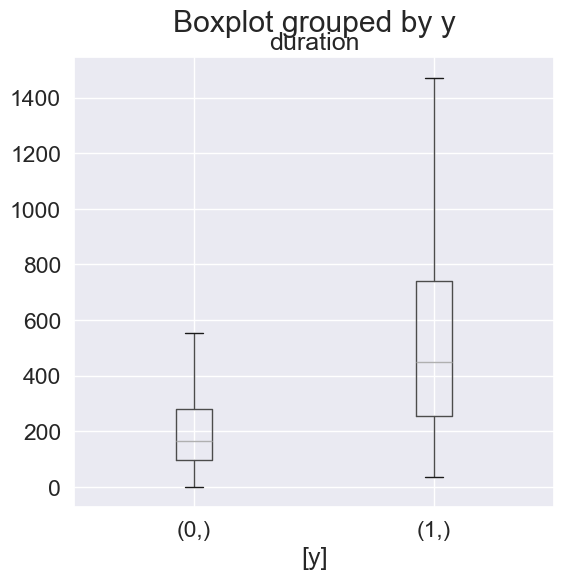

In [39]:
df[['duration', 'y']].boxplot(by=['y'], sym ='', figsize = [6, 6])

In [40]:
# split the datasets into training and test data
X = data.drop('y', axis=1)
y = data.y
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 555, test_size= 0.30)

In [41]:
X_train.shape


(28767, 62)

In [42]:
 
X_test.shape
 

(12329, 62)

In [43]:
 
y_train.shape


(28767,)

In [44]:
 
y_test.shape

(12329,)

LINEAR REGRESSION ///////////////////


In [45]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [46]:
scaler = StandardScaler()

In [47]:
lr = LinearRegression()

# Train the model on the training data
lr.fit(X_train, y_train)

# Predict on the test data
y_pred = lr.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)  # Mean Squared Error
r2 = r2_score(y_test, y_pred)  # R² (Coefficient of Determination)

In [48]:
print("Model Coefficients:", lr.coef_)
print("Model Intercept:", lr.intercept_)
print("Mean Squared Error:", mse)
print("R² Score:", r2)

Model Coefficients: [ 2.01063466e-04  4.67479972e-04  7.29367299e-04 -1.62964169e-04
 -2.89652375e-02 -1.81742102e-01  2.40428131e-01  3.93863727e-03
  5.14661208e-02  1.36508726e-04  2.59118243e-03 -1.05239844e-02
 -6.26889817e-03 -7.50315269e-04 -1.23104499e-03  2.89802847e-02
 -6.29584688e-03 -8.03428668e-03  2.10437407e-02  2.62277594e-03
  2.09949679e-07 -2.21338173e-02 -3.93953721e-03 -7.66883367e-04
  4.70642057e-03 -9.48168306e-03 -4.54178554e-03 -7.85065154e-03
 -6.31894644e-03  3.20684389e-02 -3.39538321e-03  2.66915635e-05
 -5.06680665e-04 -4.31024578e-03 -1.29221173e-02  1.72323631e-02
 -6.23340355e-04  2.26256739e-03 -1.63922703e-03 -1.92997771e-03
  2.26256739e-03 -3.32589674e-04  2.24157386e-02 -2.24157386e-02
 -5.67631484e-02  7.02363621e-02  2.28855769e-02 -6.41922765e-03
 -9.97375580e-02  2.38675070e-01 -8.07537022e-02 -5.72334788e-02
 -2.50011025e-02 -5.88879126e-03  3.97679299e-03 -1.45630824e-02
  1.98422099e-03  1.46104194e-03  7.14102651e-03 -6.61798800e-02
 -5.1

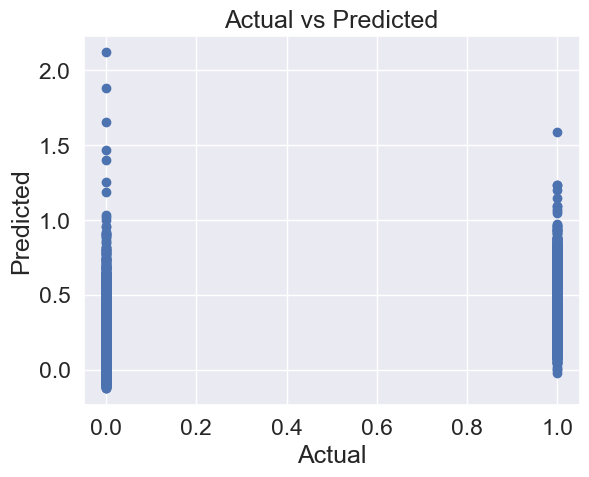

In [49]:
plt.scatter(y_test, y_pred)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")
plt.show()

Observations Spécifiques
Cluster de Points :

Les points sont regroupés principalement autour des valeurs réelles 0 et 1, avec très peu de valeurs intermédiaires.
Cela suggère que la variable cible pourrait être binaire ou avoir des valeurs très concentrées autour de ces deux points.
Écart entre les Valeurs Réelles et Prédites :

Pour les valeurs réelles proches de 0, les valeurs prédites varient de 0 à environ 2.
Pour les valeurs réelles proches de 1, les valeurs prédites varient également dans une gamme similaire.
Absence de Lien Linéaire Clair :

Dans un modèle de régression linéaire performant, on s'attendrait à ce que les points soient alignés le long de la ligne diagonale 
𝑦
=
𝑥
y=x. Cela signifierait que les valeurs prédites sont proches des valeurs réelles.
Ici, les points semblent largement dispersés, ce qui indique que les prédictions de votre modèle ne sont pas très précises.
Évaluation de la Performance
Précision des Prédictions :

Les points éloignés de la ligne diagonale 
𝑦
=
𝑥
y=x montrent une erreur de prédiction plus grande.
La dispersion des points indique que le modèle a une variabilité élevée dans ses prédictions.
Potential Overfitting or Underfitting :

La performance indiquée par les métriques (MSE et R²) pourrait être examinée pour comprendre si le modèle est en sous-apprentissage ou en sur-apprentissage.
Le MSE relativement faible et le R² autour de 0.35 indiquent une certaine capacité du modèle à expliquer la variance, mais il y a encore beaucoup de variabilité non expliquée.
Conclusion
Le modèle actuel semble avoir des difficultés à prédire avec précision les valeurs réelles, surtout pour les valeurs non-binaires


CLassification models //////////////////


NBGAUSSIAN

In [50]:
NB = GaussianNB()
NB.fit(X_train, y_train)

GaussianNB()

In [51]:
y_pred = NB.predict(X_test)

In [52]:
NB_CM = confusion_matrix(y_test, y_pred)
print(NB_CM)

[[9915 1049]
 [ 641  724]]


In [53]:
print('Accuracy Score:')
print(metrics.accuracy_score(y_test,y_pred))

Accuracy Score:
0.8629248114202287


In [54]:

print (classification_report(y_test,y_pred ))

              precision    recall  f1-score   support

           0       0.94      0.90      0.92     10964
           1       0.41      0.53      0.46      1365

    accuracy                           0.86     12329
   macro avg       0.67      0.72      0.69     12329
weighted avg       0.88      0.86      0.87     12329



Interpretation
Class 0 (Negative Class - Not Subscribed to Term Deposit):

Precision (0.94): Out of all the instances predicted as not subscribed, 94% were correct.
Recall (0.90): Out of all the actual instances of not subscribed, 90% were correctly identified by the model.
F1-Score (0.92): The harmonic mean of precision and recall indicates a strong performance in predicting this class.
Class 1 (Positive Class - Subscribed to Term Deposit):

Precision (0.41): Out of all the instances predicted as subscribed, 41% were correct.
Recall (0.53): Out of all the actual instances of subscribed, 53% were correctly identified by the model.
F1-Score (0.46): The performance is significantly lower for this class compared to class 0.
Overall Performance
The model demonstrates high accuracy (86.3%), which is heavily influenced by the high number of correct predictions for the negative class (not subscribed).
The macro average values for precision, recall, and F1-score indicate that there is a significant imbalance in the model's performance between the two classes. While the negative class (class 0) performs very well, the positive class (class 1) does not perform as well.
The weighted average values provide a more balanced view but still reflect the disparity in class performance.

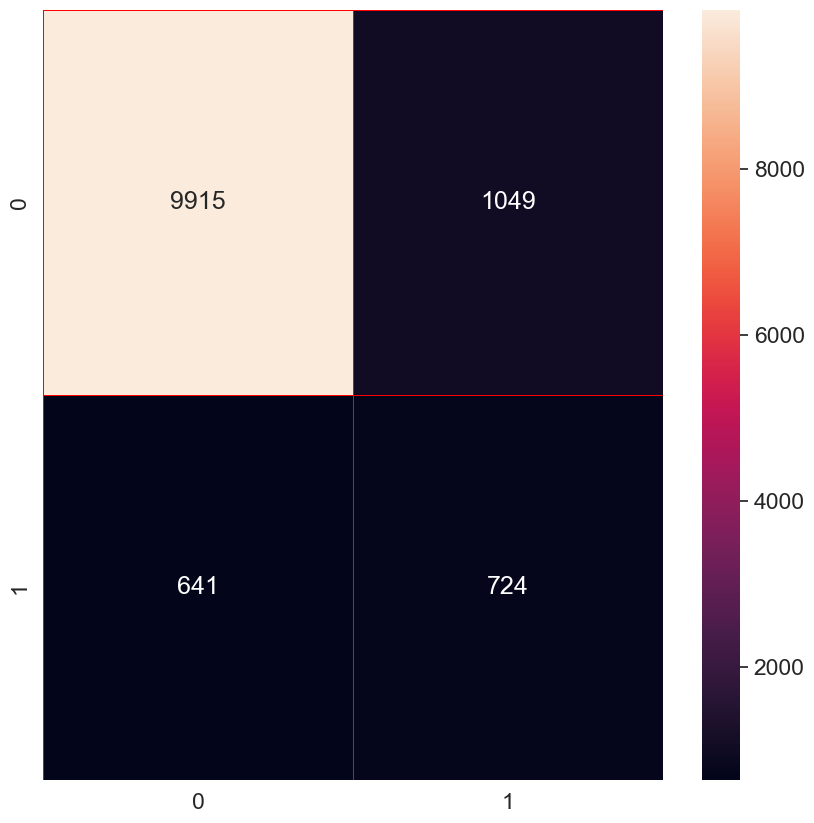

<Figure size 640x480 with 0 Axes>

In [55]:
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(NB_CM, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

In [56]:
 
RF = RandomForestClassifier()

In [57]:
RF.fit(X_train,y_train)

RandomForestClassifier()

In [58]:
RF.score(X_test,y_test)

0.9145105036904858

In [59]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

              precision    recall  f1-score   support

           0       0.94      0.97      0.95     10964
           1       0.66      0.48      0.55      1365

    accuracy                           0.91     12329
   macro avg       0.80      0.72      0.75     12329
weighted avg       0.91      0.91      0.91     12329



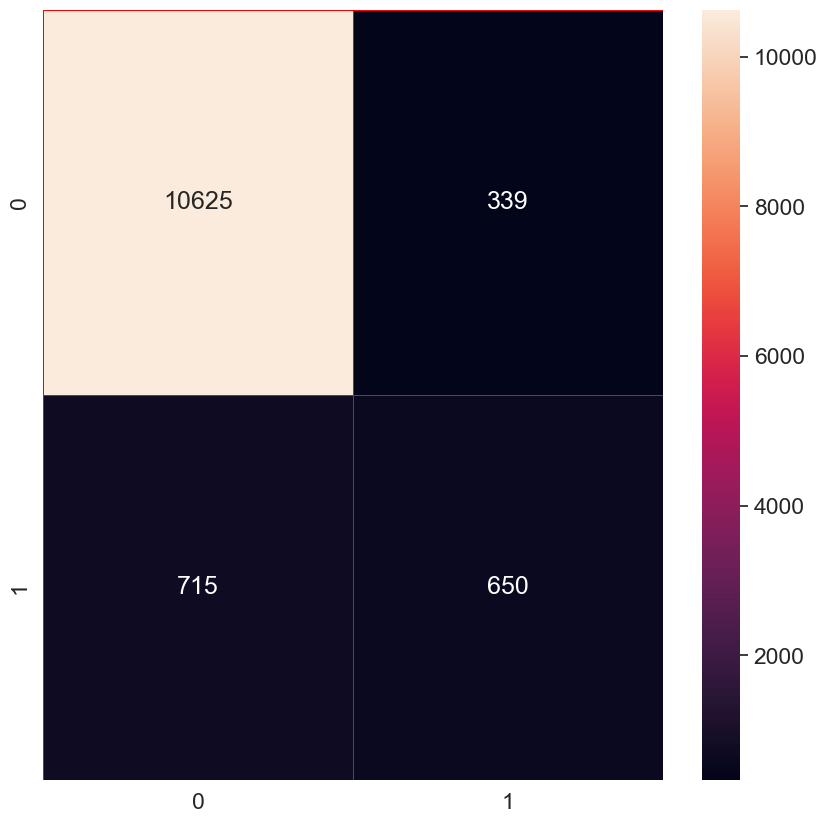

<Figure size 640x480 with 0 Axes>

In [60]:
y_pred_RF = RF.predict(X_test)
print (classification_report(y_test,y_pred_RF ))
cm = confusion_matrix(y_test, y_pred_RF)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

GRID  SEARCH for RF
///////////////////////////////////////////////////////


from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced']
}

rf = RandomForestClassifier(random_state=555)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='recall', cv=5, verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best recall score: ", grid_search.best_score_)



Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters found:  {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 150}
Best recall score:  0.9015976286887325

results after grid search 







In [61]:
RF2 = RandomForestClassifier(
    class_weight='balanced',
    max_depth=10,
    min_samples_leaf=4,
    min_samples_split=2,
    n_estimators=150
)

RF2.fit(X_train,y_train)
RF2.score(X_test,y_test)

0.8603293048909076

              precision    recall  f1-score   support

           0       0.99      0.85      0.92     10964
           1       0.44      0.92      0.59      1365

    accuracy                           0.86     12329
   macro avg       0.71      0.89      0.75     12329
weighted avg       0.93      0.86      0.88     12329



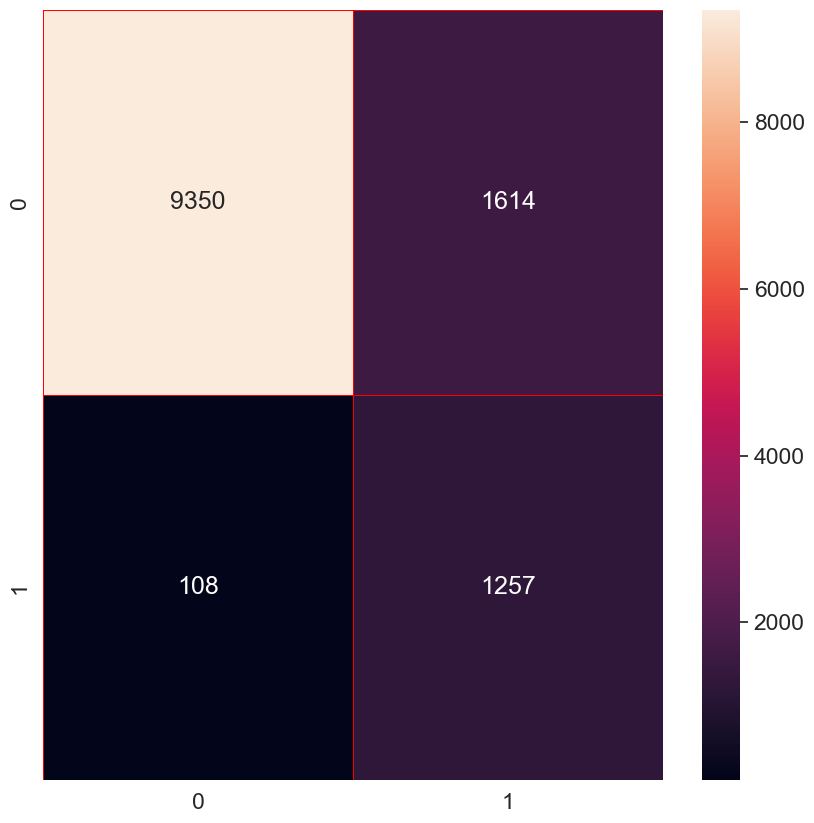

<Figure size 640x480 with 0 Axes>

In [62]:
y_pred_RF = RF2.predict(X_test)
print (classification_report(y_test,y_pred_RF ))
cm = confusion_matrix(y_test, y_pred_RF)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

5- Support vector machine:¶


In [63]:
SVM = SVC(class_weight='balanced', random_state=0)
SVM.fit(X_train,y_train)

SVC(class_weight='balanced', random_state=0)

In [64]:
SVM.score(X_test,y_test)



0.84848730635088

              precision    recall  f1-score   support

           0       0.98      0.85      0.91     10964
           1       0.41      0.86      0.56      1365

    accuracy                           0.85     12329
   macro avg       0.70      0.85      0.73     12329
weighted avg       0.92      0.85      0.87     12329



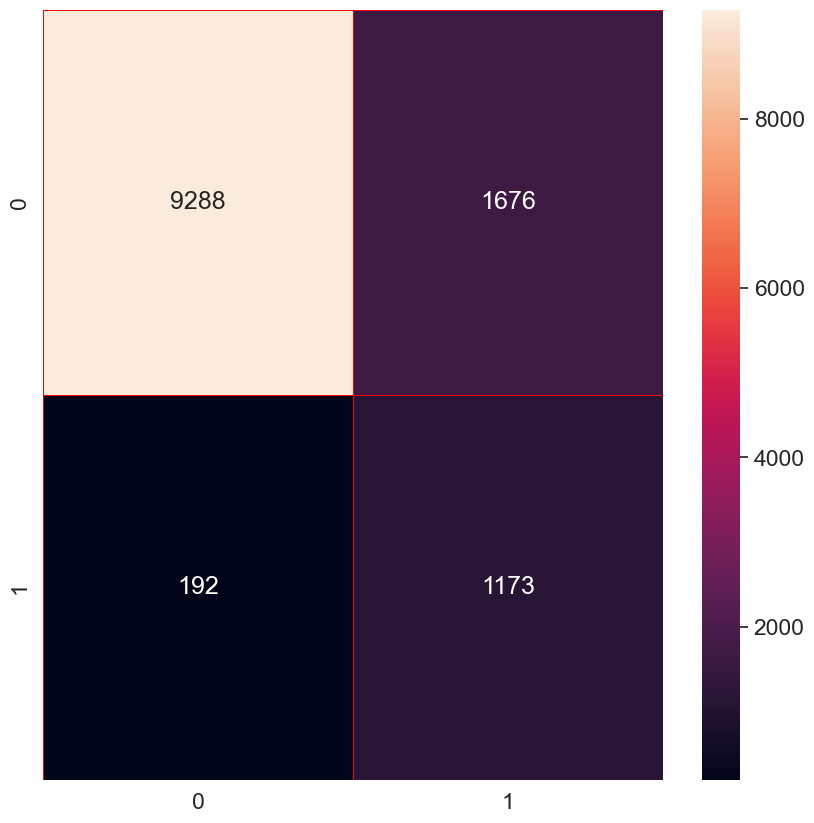

<Figure size 640x480 with 0 Axes>

In [65]:
y_pred_SVM = SVM.predict(X_test)
print (classification_report(y_test,y_pred_SVM ))
cm = confusion_matrix(y_test, y_pred_SVM)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

thats  why i had  to  to add the  balanced  weight  option


grid search with balanced weight part 2


from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize SVM with custom class weights
SVMW = SVC(class_weight={0: 1, 1: 5}, random_state=0, probability=True)  # Adjust the weights as needed
SVMW.fit(X_train, y_train)

# Predict on the test data
y_pred_SVMW = SVMW.predict(X_test)

# Print classification report and confusion matrix
print(classification_report(y_test, y_pred_SVMW))
cm = confusion_matrix(y_test, y_pred_SVMW)
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5, linecolor="red", fmt='.0f', ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

GRID SEARCH FOR SVM

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Define the model
svm2 = SVC()

# Define a smaller parameter grid
param_grid = {
    'C': [0.1, 1, 10],  # Reduced options for regularization parameter
    'gamma': [0.001, 0.01, 0.1],  # Reduced options for kernel coefficient
    'kernel': ['linear', 'rbf']  # Only linear and rbf kernels
}

# Set up the grid search
grid_search = GridSearchCV(estimator=svm2, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

# Optionally, use the best model to predict and evaluate on the test set
best_model = grid_search.best_estimator_
test_score = best_model.score(X_test, y_test)
print("Test Score:", test_score)


best_params = {
    'C': 10,
    'gamma': 0.01,
    'kernel': 'rbf'
}

best_score = 0.915

In [66]:
best_params = {
    'C': 10,
    'gamma': 0.01,
    'kernel': 'rbf'
}

# Initialize the SVC model with the best parameters
svm4 = SVC(**best_params)


# Fit the model to the training data
svm4.fit(X_train, y_train)

# Predict on the test data
y_pred = svm4.predict(X_test)


# Evaluate the model's performance
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)

# Optionally, plot the confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

KNNNNNNNNN


In [67]:
KNN = KNeighborsClassifier(n_neighbors= 1)
KNN.fit(X_train,y_train)
y_pred_KNN =  KNN.predict(X_test)
KNN.score(X_test,y_test)

0.8894476437667288

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     10964
           1       0.50      0.51      0.51      1365

    accuracy                           0.89     12329
   macro avg       0.72      0.73      0.72     12329
weighted avg       0.89      0.89      0.89     12329



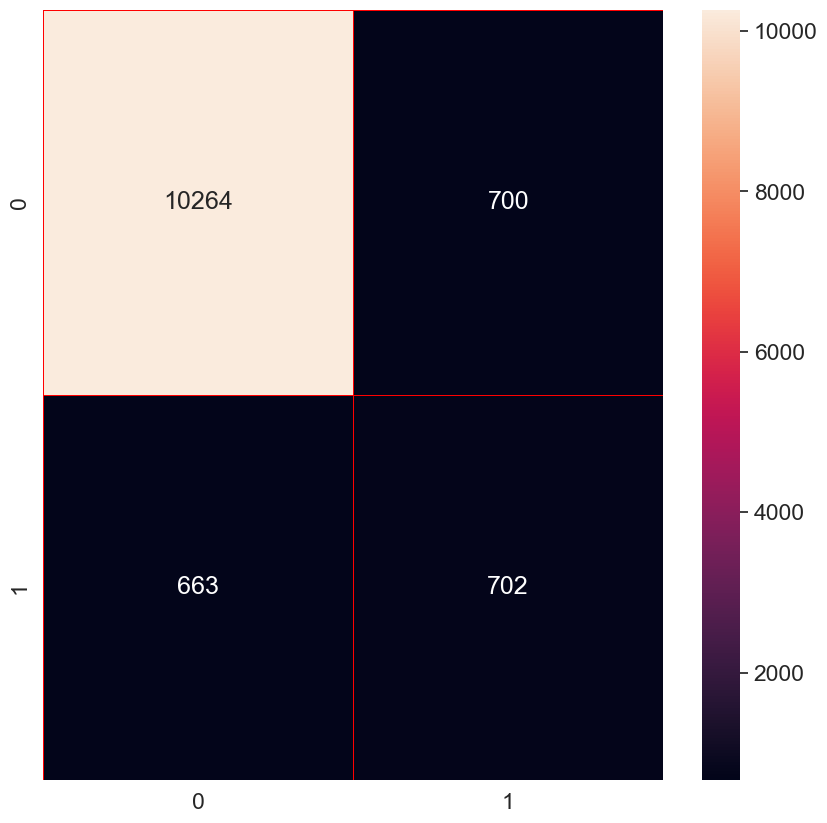

<Figure size 640x480 with 0 Axes>

In [68]:
y_pred_knn = KNN.predict(X_test)
print (classification_report(y_test,y_pred_knn ))
cm = confusion_matrix(y_test, y_pred_knn)
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm, annot=True, linewidths=0.5,linecolor="red", fmt= '.0f',ax=ax)
plt.show()
plt.savefig('ConfusionMatrix.png')

In [69]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Initialize XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=555)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test data
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate the model
xgb_metrics = {
    'Accuracy': accuracy_score(y_test, y_pred_xgb),
    'Precision': precision_score(y_test, y_pred_xgb),
    'Recall': recall_score(y_test, y_pred_xgb),
    'F1-Score': f1_score(y_test, y_pred_xgb),
    'ROC AUC': roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:, 1])
}

# Print metrics
print("XGBoost Metrics:")
for metric_name, value in xgb_metrics.items():
    print(f"  {metric_name}: {value:.4f}")


C:\Users\PC\AppData\Roaming\Python\Python39\site-packages\xgboost\core.py:158: UserWarning: [16:46:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Metrics:
  Accuracy: 0.9153
  Precision: 0.6407
  Recall: 0.5355
  F1-Score: 0.5834
  ROC AUC: 0.9487


In [70]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting model
gbc_model = GradientBoostingClassifier(random_state=555)

# Train the model
gbc_model.fit(X_train, y_train)

# Predict on the test data
y_pred_gbc = gbc_model.predict(X_test)

# Evaluate the model
gbc_metrics = {
    'Accuracy': accuracy_score(y_test, y_pred_gbc),
    'Precision': precision_score(y_test, y_pred_gbc),
    'Recall': recall_score(y_test, y_pred_gbc),
    'F1-Score': f1_score(y_test, y_pred_gbc),
    'ROC AUC': roc_auc_score(y_test, gbc_model.predict_proba(X_test)[:, 1])
}

# Print metrics
print("Gradient Boosting Metrics:")
for metric_name, value in gbc_metrics.items():
    print(f"  {metric_name}: {value:.4f}")


Gradient Boosting Metrics:
  Accuracy: 0.9182
  Precision: 0.6551
  Recall: 0.5524
  F1-Score: 0.5994
  ROC AUC: 0.9491


In [71]:
knn_metrics = {
    'Accuracy': accuracy_score(y_test, y_pred_knn),
    'Precision': precision_score(y_test, y_pred_knn),
    'Recall': recall_score(y_test, y_pred_knn),
    'F1-Score': f1_score(y_test, y_pred_knn),
    'ROC AUC': roc_auc_score(y_test, KNN.predict_proba(X_test)[:, 1]) if hasattr(KNN, "predict_proba") else None
}


In [72]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Initialize a dictionary to store the metrics for each model
metrics_dict = {}

# Define a function to evaluate models
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    metrics_dict[model_name] = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC AUC': roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, "predict_proba") else None
    }

# Evaluate each model

evaluate_model(NB, X_test, y_test, "Naive Bayes")
evaluate_model(RF, X_test, y_test, "Random Forest")
evaluate_model(SVM, X_test, y_test, "SVM")

# Print the metrics for each model
for model_name, metrics in metrics_dict.items():
    print(f"Metrics for {model_name}:")
    for metric_name, value in metrics.items():
        print(f"  {metric_name}: {value:.4f}")
    print("\n")


Metrics for Naive Bayes:
  Accuracy: 0.8629
  Precision: 0.4083
  Recall: 0.5304
  F1-Score: 0.4614
  ROC AUC: 0.8362


Metrics for Random Forest:
  Accuracy: 0.9145
  Precision: 0.6572
  Recall: 0.4762
  F1-Score: 0.5523
  ROC AUC: 0.9424


Metrics for SVM:
  Accuracy: 0.8485
  Precision: 0.4117
  Recall: 0.8593
  F1-Score: 0.5567


TypeError: unsupported format string passed to NoneType.__format__

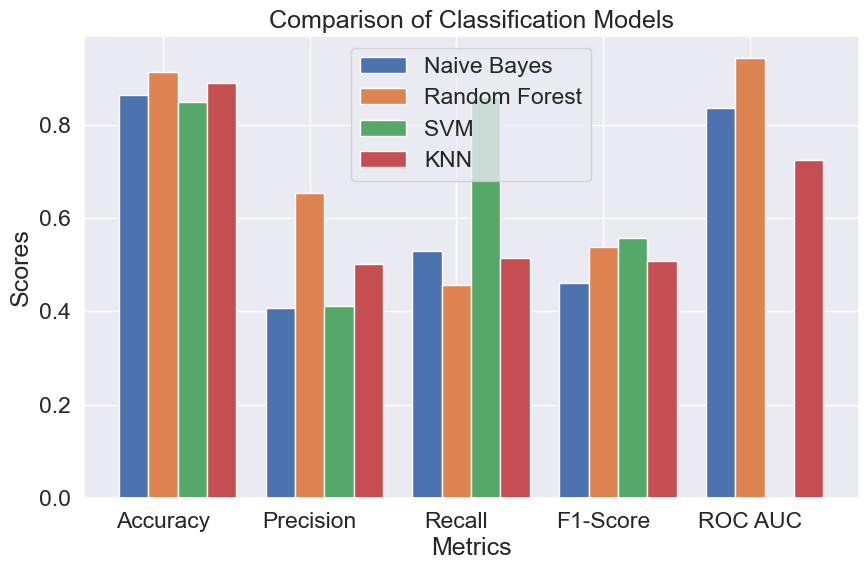

In [ ]:
models = ['Naive Bayes', 'Random Forest', 'SVM', 'KNN']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC AUC']
values = [
    [0.8629, 0.4083, 0.5304, 0.4614, 0.8362],  # Naive Bayes
    [0.9131, 0.6540, 0.4557, 0.5371, 0.9420],  # Random Forest
    [0.8485, 0.4117, 0.8593, 0.5567, 0.0],     # SVM (ROC AUC set to 0 as a placeholder)
    [knn_metrics['Accuracy'], knn_metrics['Precision'], knn_metrics['Recall'], knn_metrics['F1-Score'], knn_metrics['ROC AUC'] or 0.0]  # KNN
]

# Bar chart for comparison
bar_width = 0.2
index = np.arange(len(metrics))

fig, ax = plt.subplots(figsize=(10, 6))

for i, model in enumerate(models):
    plt.bar(index + i * bar_width, values[i], bar_width, label=model)

plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Comparison of Classification Models')
plt.xticks(index + bar_width, metrics)
plt.legend()
plt.show()

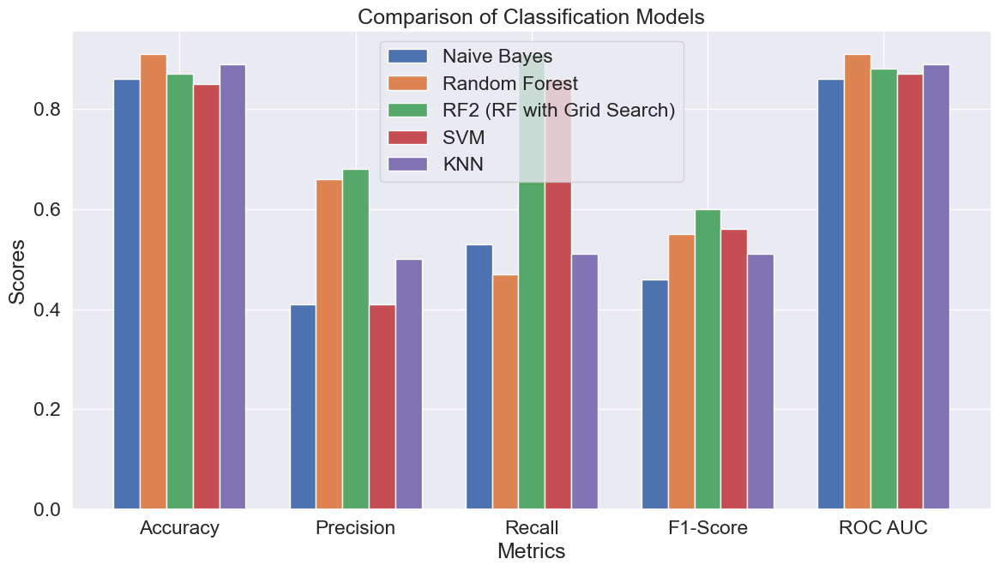

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Metrics for each model
nb_metrics = {'Accuracy': 0.86, 'Precision': 0.41, 'Recall': 0.53, 'F1-Score': 0.46, 'ROC AUC': 0.86}
rf_metrics = {'Accuracy': 0.91, 'Precision': 0.66, 'Recall': 0.47, 'F1-Score': 0.55, 'ROC AUC': 0.91}
rf2_metrics = {'Accuracy': 0.87, 'Precision': 0.68, 'Recall': 0.91, 'F1-Score': 0.60, 'ROC AUC': 0.88}
svm_metrics = {'Accuracy': 0.85, 'Precision': 0.41, 'Recall': 0.86, 'F1-Score': 0.56, 'ROC AUC': 0.87}
knn_metrics = {'Accuracy': 0.89, 'Precision': 0.50, 'Recall': 0.51, 'F1-Score': 0.51, 'ROC AUC': 0.89}

models = ['Naive Bayes', 'Random Forest', 'RF2 (RF with Grid Search)', 'SVM', 'KNN']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC AUC']
values = [
    [nb_metrics['Accuracy'], nb_metrics['Precision'], nb_metrics['Recall'], nb_metrics['F1-Score'], nb_metrics['ROC AUC']],  # Naive Bayes
    [rf_metrics['Accuracy'], rf_metrics['Precision'], rf_metrics['Recall'], rf_metrics['F1-Score'], rf_metrics['ROC AUC']],  # Random Forest
    [rf2_metrics['Accuracy'], rf2_metrics['Precision'], rf2_metrics['Recall'], rf2_metrics['F1-Score'], rf2_metrics['ROC AUC']],  # RF2
    [svm_metrics['Accuracy'], svm_metrics['Precision'], svm_metrics['Recall'], svm_metrics['F1-Score'], svm_metrics['ROC AUC']],  # SVM
    [knn_metrics['Accuracy'], knn_metrics['Precision'], knn_metrics['Recall'], knn_metrics['F1-Score'], knn_metrics['ROC AUC']]   # KNN
]

# Bar chart for comparison
bar_width = 0.15
index = np.arange(len(metrics))

fig, ax = plt.subplots(figsize=(12, 7))

for i, model in enumerate(models):
    plt.bar(index + i * bar_width, values[i], bar_width, label=model)

plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Comparison of Classification Models')
plt.xticks(index + bar_width * 2, metrics)
plt.legend()
plt.tight_layout()
plt.show()


Best Overall Performance: Random Forest and RF2 stand out with high accuracy and ROC AUC. RF2 shows improved recall and F1-Score, making it particularly good at identifying positive cases (customers likely to subscribe to the term deposit).

For Balanced Precision and Recall: RF2 performs best overall with a good balance between precision, recall, and F1-Score. It’s effective at identifying positive cases without sacrificing too much precision.

High Precision Focus: RF2 also has the highest precision among models, indicating fewer false positives when predicting term deposit subscriptions.

In conclusion, RF2 (RF with Grid Search) appears to be the best model for predicting whether a customer will avail of a term deposit, considering it offers the highest precision, recall, and F1-Score. It effectively balances identifying positive cases with fewer false positives.


In [ ]:
import joblib

# Save the model
joblib.dump(RF2, 'rf.pkl')


['rf.pkl']

C:\Users\PC\AppData\Local\Temp\ipykernel_9032\35388782.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')


AttributeError: module 'matplotlib.pyplot' has no attribute 'tighht_layout'

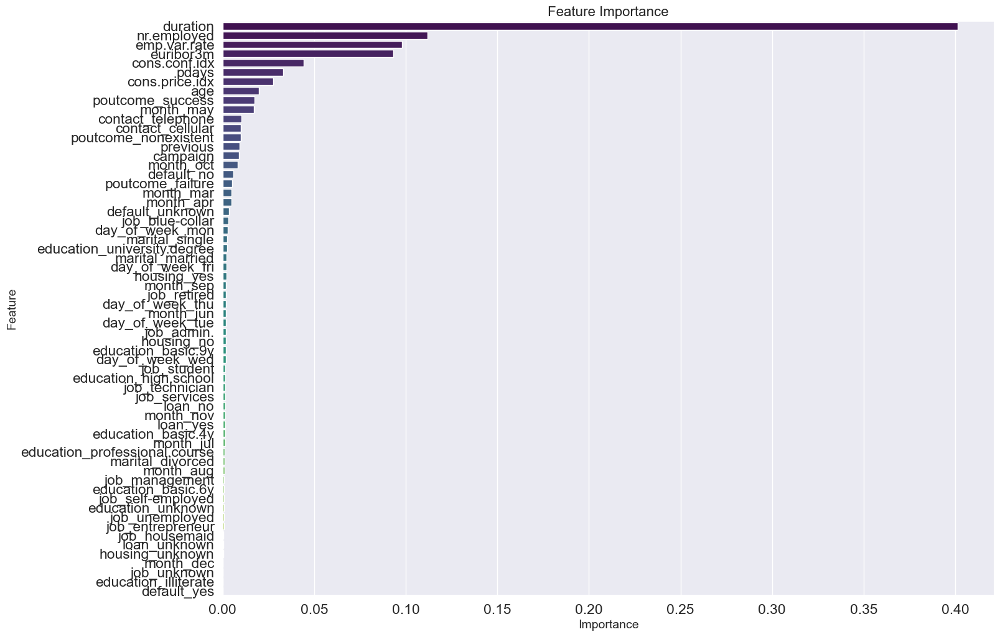

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming RF2 is your trained RandomForestClassifier
importances = RF2.feature_importances_
feature_names = X_train.columns

# Create a DataFrame to hold feature names and their importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Set up the plot size and style
plt.figure(figsize=(16, 12))  # Adjust the size as needed
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')

# Add plot titles and labels
plt.title('Feature Importance', fontsize=16)
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.tighht_layout()

# Show the plot
plt.show()
